<a href="https://colab.research.google.com/github/viriditass/Papers/blob/main/SinGAN_Learning_a_Generative_Model_from_a_Single_Natural_Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **SinGAN: Learning a Generative Model from a Single Natural Image**

논문 링크: https://ysbsb.github.io/gan/2020/12/30/SinGAN.html

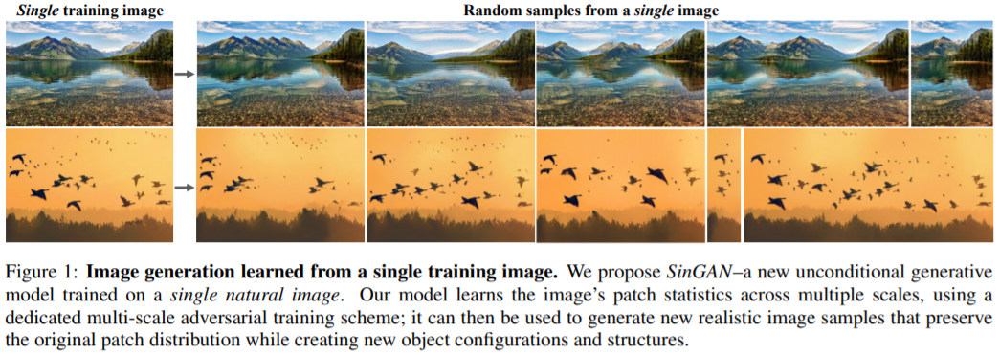

먼저 위의 그림 Figure 1을 보면 SinGAN의 결과물을 확인할 수 있다. 한장으로 위와 같이 train image와 유사하지만 새로운 object와 구성 및 구조를 포함하는 다양한 high quality image를 생성할 수 있는 것을 알 수 있다.

기존에도 natural image 한장으로부터 생성하는 연구가 있었지만 이들은 모두 conditional GAN이기 때문에 image에서 image를 mapping해야 하며, ramdom sample을 생성하기 위함이 아니라는 한계점을 가지고 있었다.

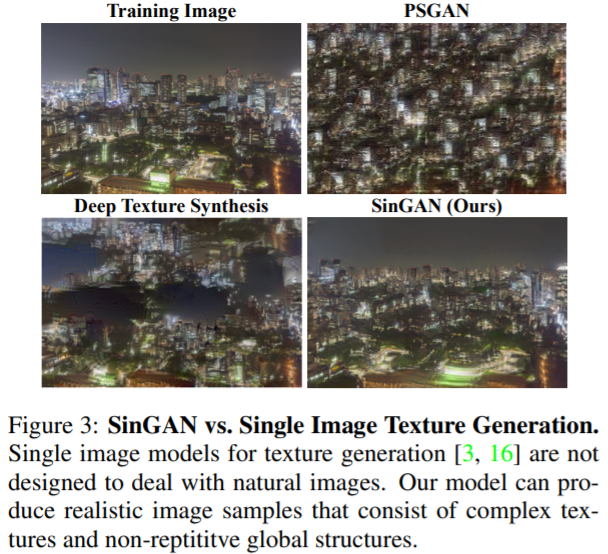

하지만 본 논문에서 제안하는 SinGAN은 unconditional한 방법으로 single image에 대해 생성을 한다. 기존의 비슷한 unconditional 방법은 texture image에 제한이 되어있었다. 따라서 이전 연구를 보면 natural image에 대해 학습 결과가 별로 좋지 않은 것을 알 수 있다.

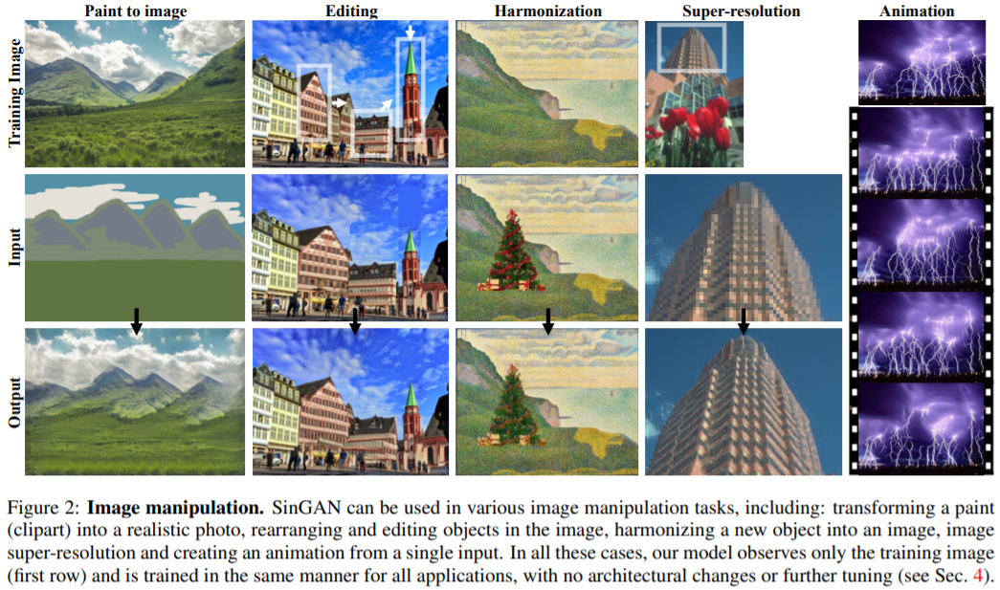

뿐만 아니라 SinGAN은 paint to image, editing, harmonization, super-resolution, animation 등과 같은 여러 **image manipulation**에 대해 추가적인 train이나 정보 없이 동일한 network로 위의 그림 Figure 2와 같이 뛰어난 성능을 보여준다. (왜 ICCV 2019에서 best paper award를 받았는지 알 수 있을것 같다...)

## **SinGAN 구조**

그러면 이제 SinGAN이 어떻게 단일 image로부터 이렇게 우수한 성능을 보여주는지 알아보겠다.

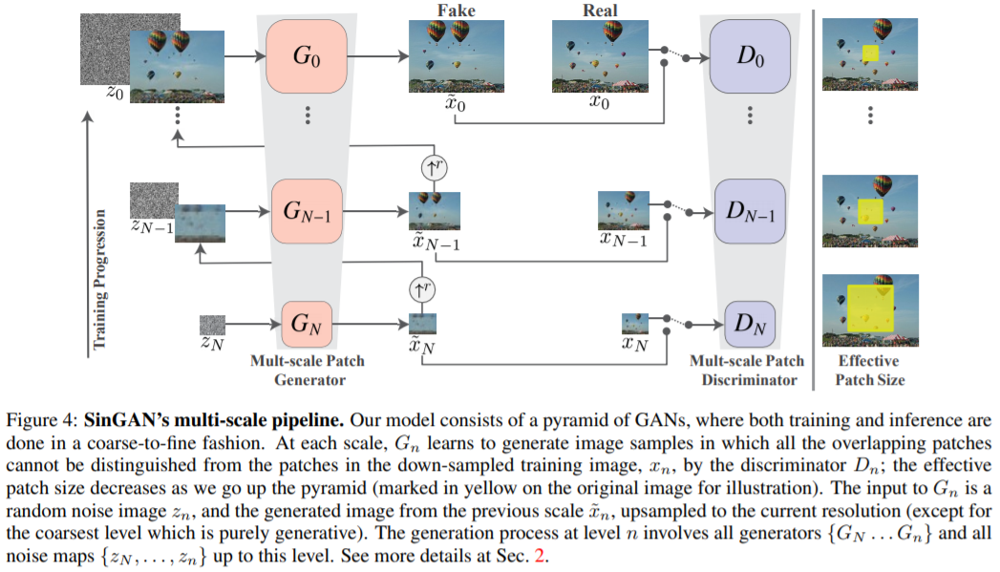

GAN은 receptive fields가 작고, 용량이 제한되어 단일 image를 기억하지 못한다. 따라서 SinGAN은 단일 image의 내부를 학습하기 위하여 위의 그림 Figure 4와 같이 **여러 scale의 patch distribution을 학습하는 fully-convolution GAN의 pyramid 구조**를 가지고 있다. 따라서 model과 image 둘다 각각 {G_0, G_1, ..., G_N}, {x_0, x_1, ..., x_N}으로 구성이 되어 있다.

자세한 train 과정은 **coarse-to-fine**으로 즉, 위의 그림 Figure 4와 같이 전체에서 세밀한 부분으로 학습이 진행된다. 한 단계씩 내려갈수록 r배만큼 down-sampling이 되는 방식이다. 이때 **G_n은 noise와 이전 단계에서 생성된 결과 image를 inpu**t으로 image를 생성하고 반대로 D_n은 down-sampling된 GT와 생성된 imag를 구분하도록 학습이 된다. 당연하게도 그림의 맨아래에 위치한 G_N의 경우는 noise만 이용하여 image를 생성한다.

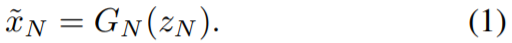

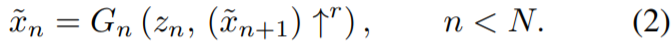

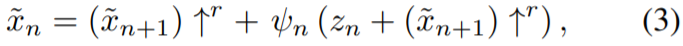

generator의 수식은 위의 식과 같은데, **up-scailing**을 하면서 **동시에 생성**을 한다.

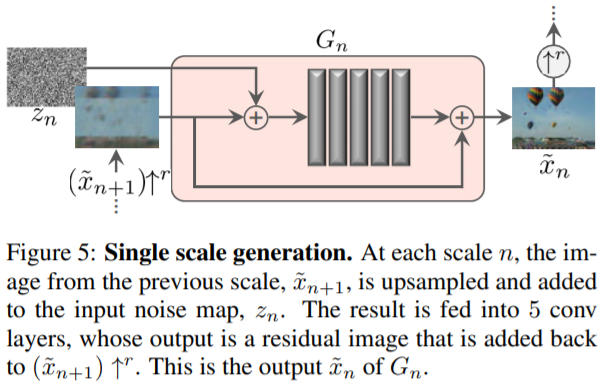

이때 ψ_n은 conv 3 x 3 - batch normalization - LeakyReLU로 구성된 5개의 convolution block으로 이루어진 fully convolutional net이다. 이렇게 설계한 이유는 **각 generator가 너무 capacity를 크게 가져가버리면 train image 자체를 외울 수 있기 때문**에 적은 capacity를 갖도록 설계한 것이다. 제일 coarse한 generator는 32개의 kernel을 사용하였고, 4개의 scale이 오를때 마다 kernel 개수를 2배로 해주었다. 또한 위의 그림 Figure 5와 같은 residual 구조를 이용하여 image를 생성하였습니다.

### **loss function**

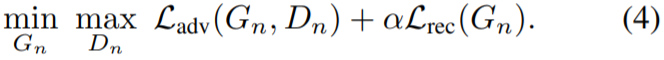

loss function은 위의 식과 같이 GAN에서 쓰이는 adversarial loss와 reconstruction loss로 구성이 되어있다. adversarial loss는 WGAN-GP loss를 사용하였으며,

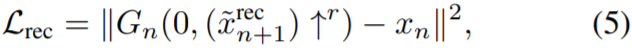

reconstruction loss는 generator가 생성한 image와 그 단계의 down-sampled된 image간의 pixel 차이를 줄이는 방향으로 학습하기 위하여 위의 식과 같이 squred loss를 사용하였다.

## **Experiments**

본 논문의 image들은 BSD(Berkeley Segmentation Database), Places, 웹에서 가져왔다.

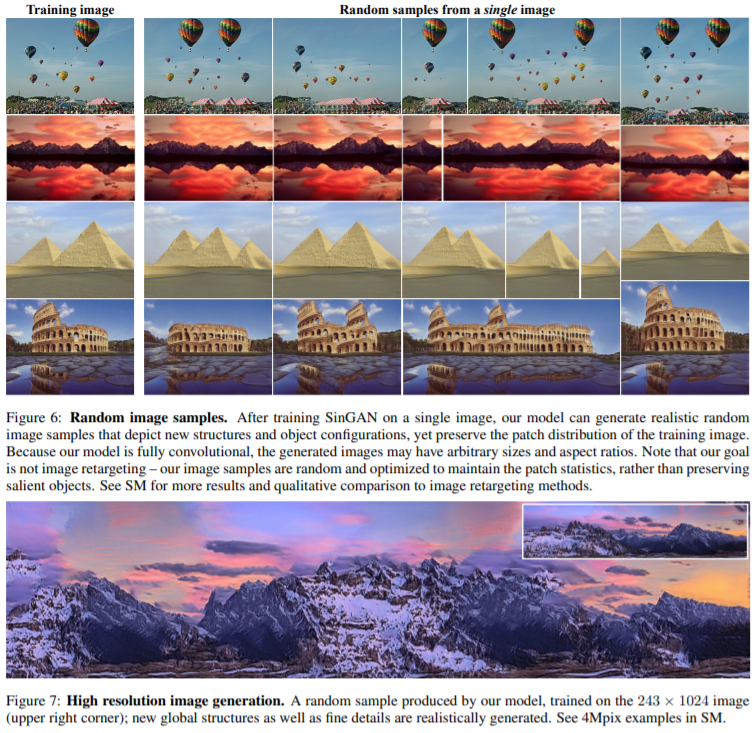

본 논문에서는 qualitatively과 quantitatively인 결과를 모두 보여준다. 위의 그림 Figure 6을 보면 공기 풍선 또는 피라미드의 전체적인 구조와 질감을 잘 보존하면서 기존에 존재하지 않는 새로운 patch 조합을 생성한다. 또한, generator가 fuuly-convolutional 구조이기 때문에 임의의 resolution을 갖는 image를 생성할 수 있다는 점이 매우 흥미롭다. 또한 위의 그림 Figure 7을 보면 high-resolution image도 자연스럽게 생성하는 것을 볼 수 있다.

정량적인 평가(Quantitative Evaluation)를 위해 저자는 2가지 방법을 사용하였다. 첫번째는 **AMT(Amazon Mechanical Turk)**로 사람들이 image가 fake인지 real인지 투표하는 방식을 사용하였고 두번째는 **SIFID(Single Image FID)**로 GAN에서 자주 사용되는 FID(Frechet Inception Distance)를 single image에 알맞게 변형한 것이다.

AMT를 이용한 실험은 총 두가지의 환경에서 진행이 되었다. 첫번째 환경은 real image와 SinGAN이 생성한 fake image를 둘 다 보여주고 어느 쪽이 fake인지 맞추는 paired 실험이며, 두번째 환경은 real image나 fake image 중 하나만 보여주고 얼마나 헷갈리는지를 확인하는 unpaired 실험이다.

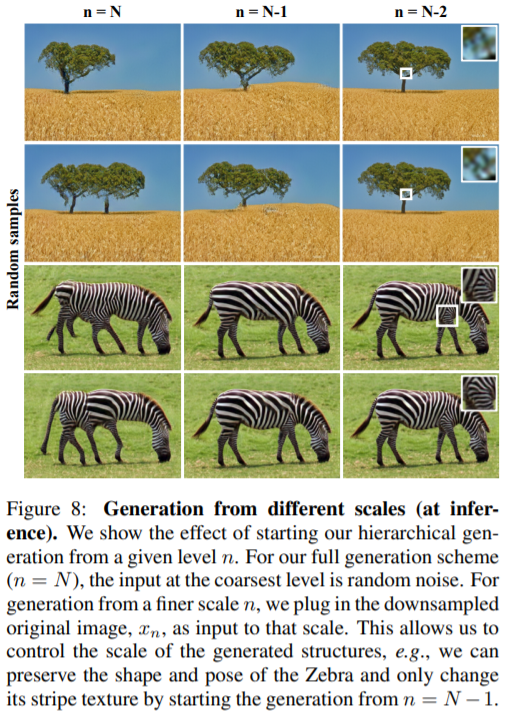

한명의 worker당 50장의 image를 보여주는데, coarsest한 N scale로부터 inference를 할때와 그 위의 N-1 scale에서 inference를 할 때의 결과를 비교한다. N scale은 위에서 network의 구조를 봤으면 알 수 있듯이 noise로부터 생성하며 N-1 scale부터는 전 scale의 output을 input으로 넣어주기 때문에 더욱 input image와 유사한 모양과 배열을 갖는 image를 생성 할 수 있다.

위의 그림 Figure 8은 N ~ N-2 scale에 따른 결과이다. 가장 coarse한 부분인 N 부분에서 얼룩말을 보면 이상한 다리를 가지는 것을 확인할 수 있다. 반대로 N-2 scale을 보면 texture나 배열의 변화 등이 매우 적은 실제 같은 image인 것을 확인할 수 있다. 본 논문에서는 실험적으로 **N-1 scale일 때가 다양성도 보장이 되며, 원본의 형태도 유지하면서 inference를 하여 image를 잘 생성**할 수 있다고 한다.

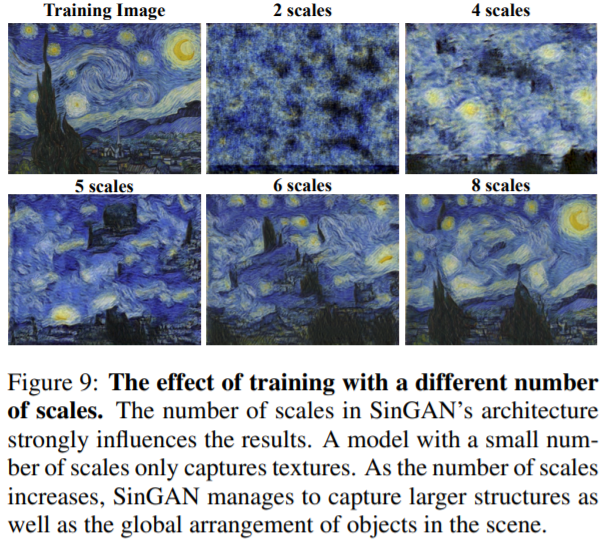

위의 그림 Figure 9는 scale의 갯수를 변경하여 실험한 결과이다. scale이 작을수록 가장 coarsest한 receptive field의 크기가 작아지기 때문에 미세한 texture만 캡처할 수 있다. 반대로 scale이 클수록 더 큰 구조로 인하여 전체적인 object 배열이 더 잘 보존이 된다.

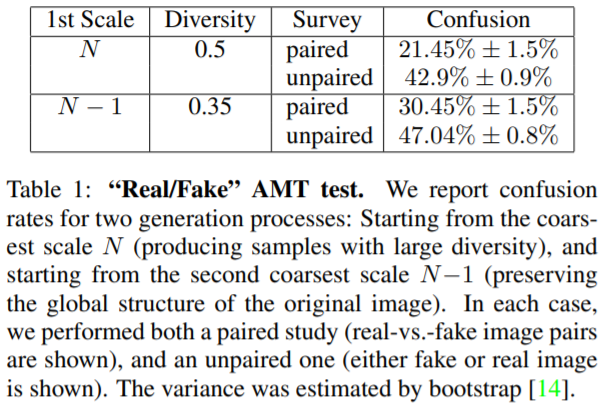

위의 표 Table 1은 아까전에 설명했던 실험의 결과이다. N scale 일 때 unpaired의 경우 약 43%의 confusion 정도를 보이지만 N-1 scale일 경우는 거의 47%의 confusion을 보이는 것을 확인할 수 있다. 즉, 사람이 보기에도 굉장히 헷갈릴 정도로 퀄리티가 높은 것을 알 수 있다.

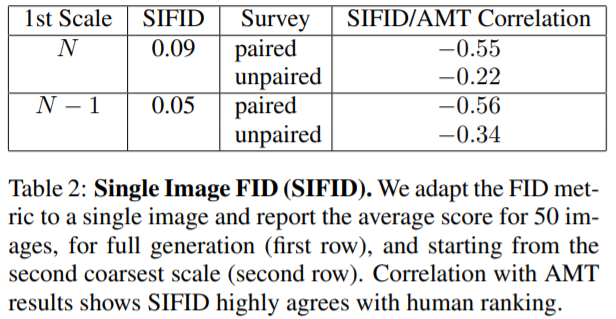

위의 표 Table 2는 SIFID에 대한 결과를 보여준다.

자 이제 SinGAN의 연구의 하이라이트라고도 볼 수 있는 응용 사례에 대해 알아보겠다. 이 글의 초반에 언급했듯이 무려 5가지의 응용 사례가 있다.

### **Single Image Super Resolution**

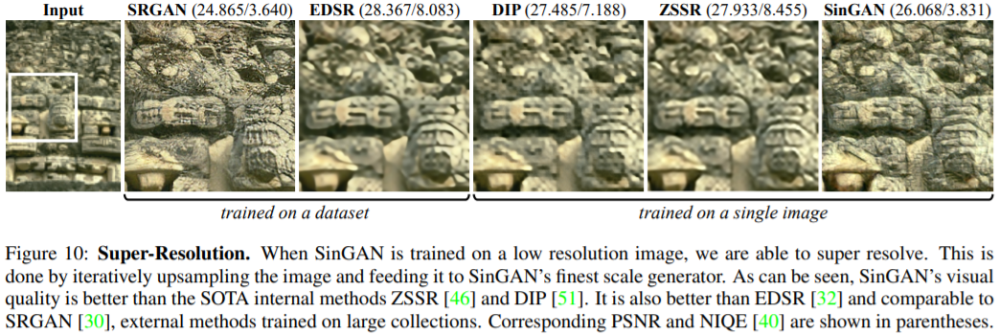

super-resolution을 위하여 reconstruction loss에 α = 100 값을 주었고, low-resolution image 한장으로 학습 시킨 후, test시에는 up-sampling한 image를 제일 마지막 generator인 G_0에 noise와 함께 input을 넣어준다. high-resolution output을 얻기 위하여 이러한 과정을 k번 반복하였으며, 위의 그림 Figure 10이 바로 그 결과물이다.

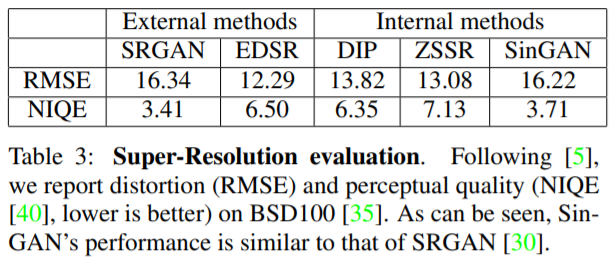

위의 표 Table 3을 보면 기존의 방식들과 비교를 한 것인데 이때 RMSE와 NIQE가 SRGAN과 유사한 성능을 보인다. 이때, SRGAN의 경우 train 데이터를 필요로 하지만 SinGAN은 단 1장의 image로 SRGAN과 비슷한 성능을 보여준다.

### **Paint-to-Image**

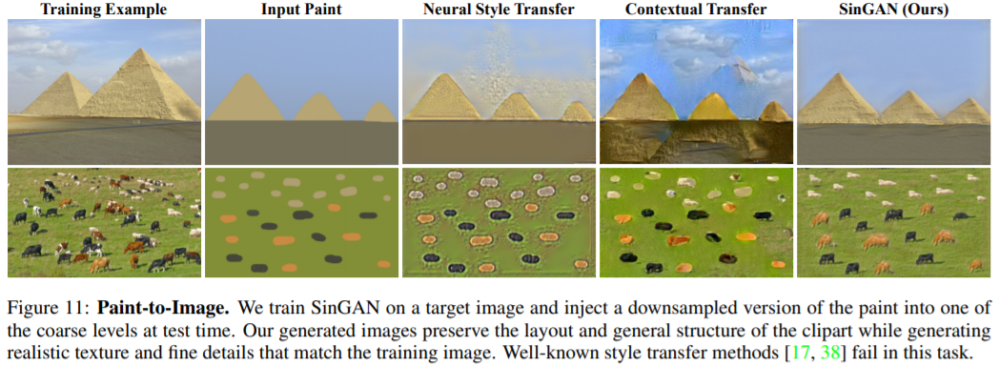

다음은 paint image로부터 image를 생성해내는 style transfer 실험이다. input으로 patnt image를 N-1 혹은 N-2 scale에 down-sampling하여 넣어주면 train에 사용된 style을 가진 image를 위의 그림 Figure 11과 같이 생성한다.

### **Harmonization**

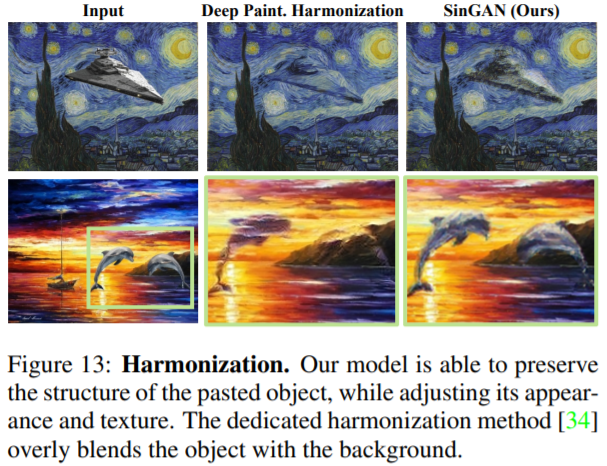

다음으로 image에 다른 object를 삽입하면 주변 배경과 조화를 이루며 object를 변형시키는 harmonization에 대해 위의 그림 Figure 13은 이에 대한 결과를 보여준다.

### **Editing**

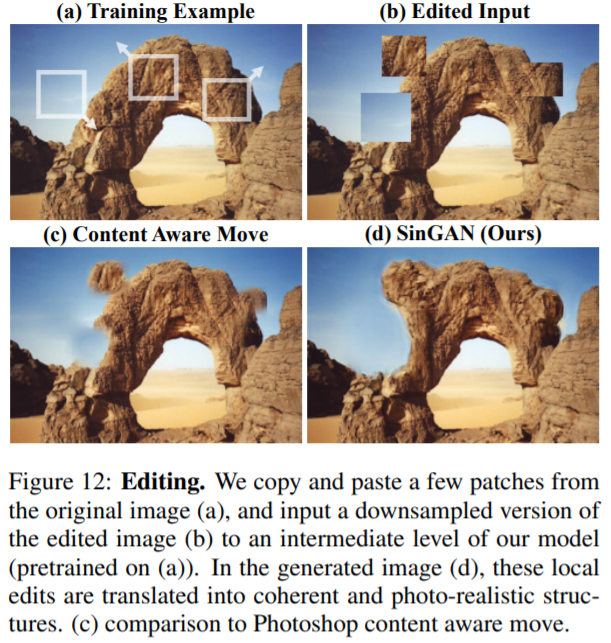

다음으로 위의 그림 Figure 12는 Image의 일부 영역을 복사하여 다른 위치에 붙여 넣었을 때 Image를 매끄럽고 자연스럽게 만들어주는 editing의 예시이다. Photoshop에 내장되어 있는 Content-Aware-Move보다 우수한 성능을 보여준다.

### **Single Image Animation**

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo('https://www.youtube.com/watch?v=xk8bWLZk4DU', width=600, height=480)

마지막으로 한 장의 Image로부터 짧은 video clip을 생성하는 single image animation이다. 이에 대한 결과는 위의 영상을 보면 확인할 수 있다.